In [0]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

In [2]:
#Upload images
from google.colab import files
uploaded = files.upload()

Saving building_1.jpg to building_1.jpg
Saving building_2.jpg to building_2.jpg
Saving building_3.jpg to building_3.jpg
Saving building_4.jpg to building_4.jpg
Saving building_5.jpg to building_5.jpg


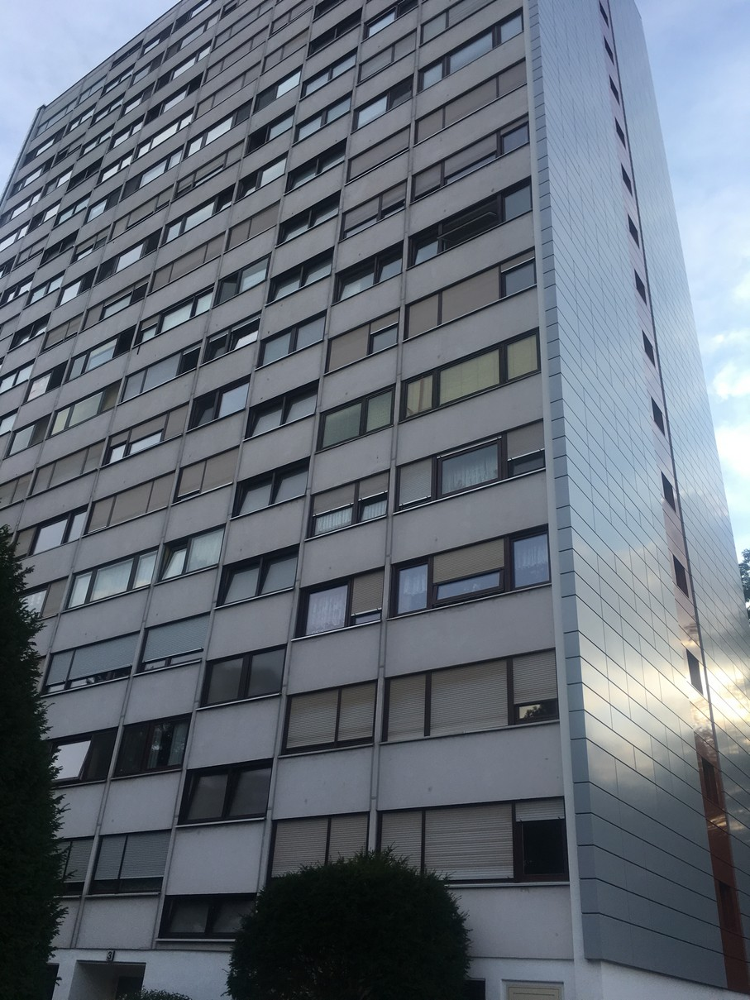

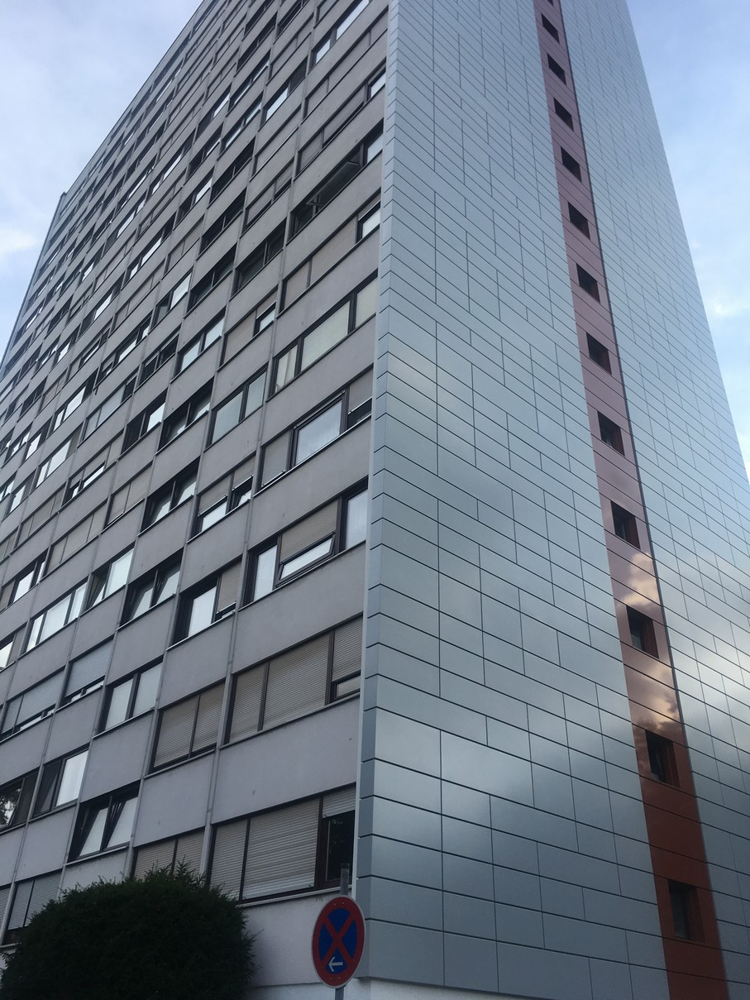

In [3]:
# browse sample images
cv2_imshow(cv2.imread("building_1.jpg"))
cv2_imshow(cv2.imread("building_2.jpg"))


In [0]:
# point are taken manually from first two images
p_building_1 = np.array([[676, 869], [464, 819], [666, 704], [473, 681], [659, 564], [478, 564], [654, 450], [485, 461]])
p_building_2 = np.array([[440, 835], [283, 815], [448, 650], [301, 666], [452, 499], [318, 541], [462, 373], [330, 432]])
p_building_3 = np.array([[301,840], [205,823], [323,658], [231,676], [343, 506], [252, 553], [359, 383], [269, 446]])

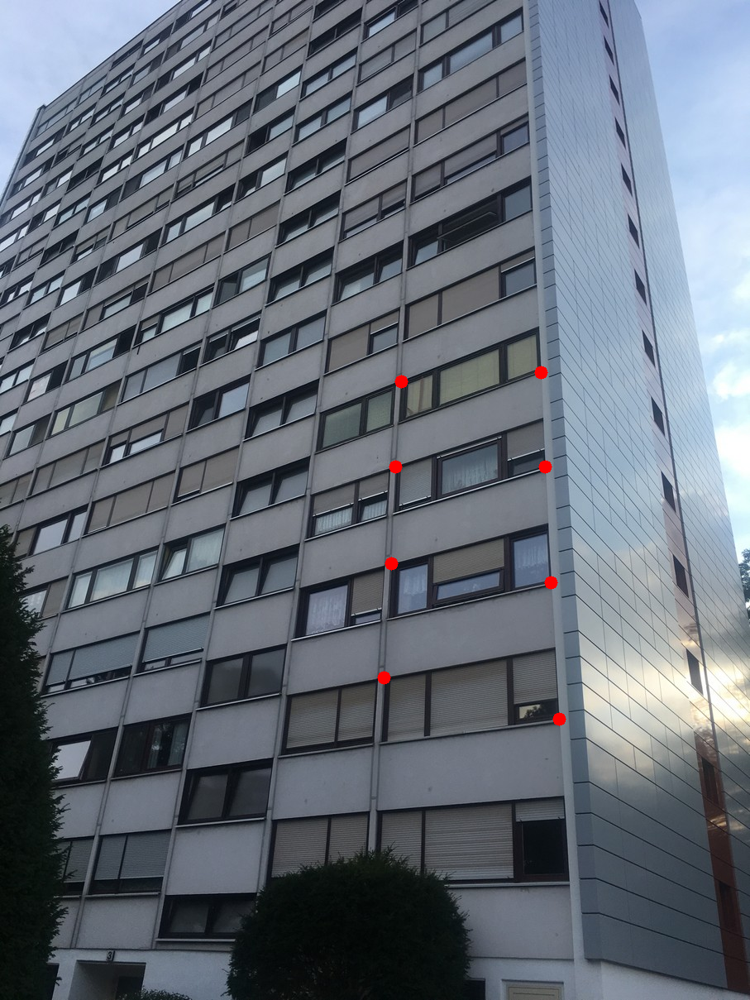

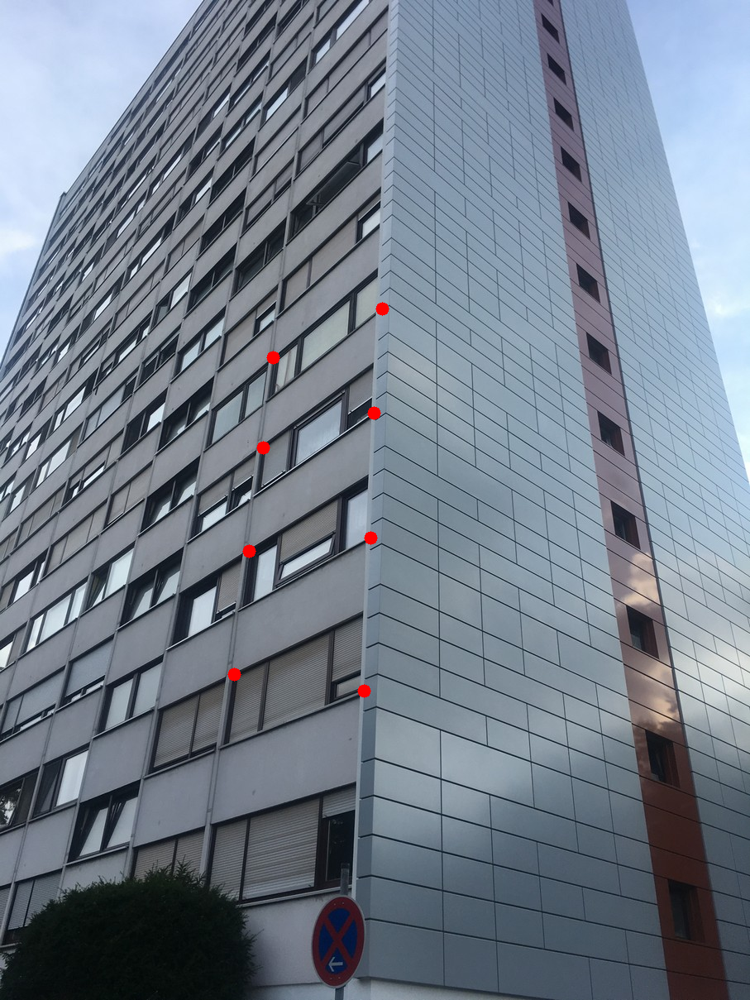

In [5]:
# Lets visualize the points
def drawCircles(img, points):
  for point in points:
    cv2.circle(img, (point[0], point[1]), 8, (0,0,255), -1)
  cv2_imshow(img)

building_1 = cv2.imread("building_1.jpg")
building_2 = cv2.imread("building_2.jpg")

drawCircles(building_1, p_building_1)
drawCircles(building_2, p_building_2)


In [0]:
def normalize2dpts(pts):
    ''' This function translates and scales the input (homogeneous) points 
    such that the output points are centered at origin and the mean distance
    from the origin is sqrt(2). As shown in Hartley (1997), this normalization
    process typically improves the condition number of the linear systems used
    for solving homographies, fundamental matrices, etc.
    
    References:
        Richard Hartley, PAMI 1997
        Peter Kovesi, MATLAB functions for computer vision and image processing,
        http://www.csse.uwa.edu.au/~pk
     '''
    if pts.shape[0]!=3:
        raise ShapeError('pts must be 3xN')
    
    finiteind = abs(pts[2]) > np.finfo(float).eps
    pts[0,finiteind] = pts[0,finiteind]/pts[2,finiteind]
    pts[1,finiteind] = pts[1,finiteind]/pts[2,finiteind]
    pts[2,finiteind] = 1
    
    # Centroid of finite points
    c = [np.mean(pts[0,finiteind]), np.mean(pts[1,finiteind])] 
    
    # Shift origin to centroid.
    newp0 = pts[0,finiteind]-c[0] 
    newp1 = pts[1,finiteind]-c[1] 

    meandist = np.mean(np.sqrt(newp0**2 + newp1**2));
    
    scale = np.sqrt(2)/meandist;
    '''
    T = [scale   0   -scale*c(1)
         0     scale -scale*c(2)
         0       0      1      ];
    '''
    T = np.eye(3)
    T[0][0] = scale
    T[1][1] = scale
    T[0][2] = -scale*c[0]
    T[1][2] = -scale*c[1]
    newpts = np.dot(T, pts)    
    
    return newpts, T

def constraint_matrix(x1,x2):
    npts = x1.shape[1]
    # stack column by column
    A = np.c_[x2[0]*x1[0], x2[0]*x1[1], x2[0], x2[1]*x1[0], x2[1]*x1[1], x2[1], x1[0], x1[1], np.ones((npts,1))]
    return A

def eight_point_algorithm(x1,x2):
    
    # perform the normalization (translation and scaling)
    x1, T1 = normalize2dpts(x1);
    x2, T2 = normalize2dpts(x2);
    
    # assemble the constraint matrix
    A = constraint_matrix(x1,x2)
    
    # A*vec(F) = 0 implies that the fundamental matrix F can be extracted from 
    # singular vector of V corresponding to smallest singular value
    (U, S, V) = np.linalg.svd(A)
    V = V.conj().T;
    F = V[:,8].reshape(3,3).copy()
    
    # recall that F should be of rank 2, do the lower-rank approximation by svd
    (U,D,V) = np.linalg.svd(F);
    F = np.dot(np.dot(U,np.diag([D[0], D[1], 0])),V);

    # denormalize
    F = np.dot(np.dot(T2.T,F),T1);
    return F

In [0]:
def process_input_pointpairs(x1, x2):
  npts = max(x1.shape)
  if 2 == x1.shape[0]:  # input is a fat matrix
    x1 = np.r_[x1, np.ones((1,npts))]
    x2 = np.r_[x2, np.ones((1,npts))]
  else: # input is a tall matrix
    x1 = np.r_[x1.T, np.ones((1,npts))]
    x2 = np.r_[x2.T, np.ones((1,npts))]
        
    return x1,x2

In [0]:
def drawlines(img1,img2,lines,pts1,pts2):
    ''' img1 - image on which we draw the epilines for the points in img2
        lines - corresponding epilines '''
    # print(img1.shape)
    r,c, _ = img1.shape
    # img1 = cv2.cvtColor(img1,cv2.COLOR_GRAY2BGR)
    # img2 = cv2.cvtColor(img2,cv2.COLOR_GRAY2BGR)
    for r,pt1,pt2 in zip(lines,pts1,pts2):
        color = tuple(np.random.randint(0,255,3).tolist())
        x0,y0 = map(int, [0, -r[2]/r[1] ])
        x1,y1 = map(int, [c, -(r[2]+r[0]*c)/r[1] ])
        img1 = cv2.line(img1, (x0,y0), (x1,y1), color,1)
        img1 = cv2.circle(img1,tuple(pt1),5,color,-1)
        img2 = cv2.circle(img2,tuple(pt2),5,color,-1)
    return img1,img2

In [0]:
def findEpipolarLinesEnd2End(image_1, points_1, image_2, points_2):
  image_1 = image_1.copy()
  image_2 = image_2.copy()
  # Lets find fundamental matrix

  p_x1, p_x2 = process_input_pointpairs(points_1, points_2)
  F = eight_point_algorithm(p_x1, p_x2)

  print("Fundamental matrix: \n",F)

  # Find epilines corresponding to points in right image (second image) and
  # drawing its lines on left image
  lines1 = cv2.computeCorrespondEpilines(points_2.reshape(-1,1,2), 2,F)
  lines1 = lines1.reshape(-1,3)
  img5,img6 = drawlines(image_1,image_2,lines1,points_1,points_2)
  # Find epilines corresponding to points in left image (first image) and
  # drawing its lines on right image
  lines2 = cv2.computeCorrespondEpilines(points_1.reshape(-1,1,2), 1,F)
  lines2 = lines2.reshape(-1,3)
  img3,img4 = drawlines(image_2,image_1,lines2,points_2,points_1)
  cv2_imshow(img3)
  cv2_imshow(img4)

### Lets draw epipolar lines for each building photos pairs

Fundamental matrix: 
 [[-1.53212966e-05  7.50104121e-05 -3.87762056e-02]
 [-4.91567119e-05  6.64242714e-06  9.61508295e-03]
 [ 3.19112954e-02 -1.69571477e-02  1.00000000e+00]]


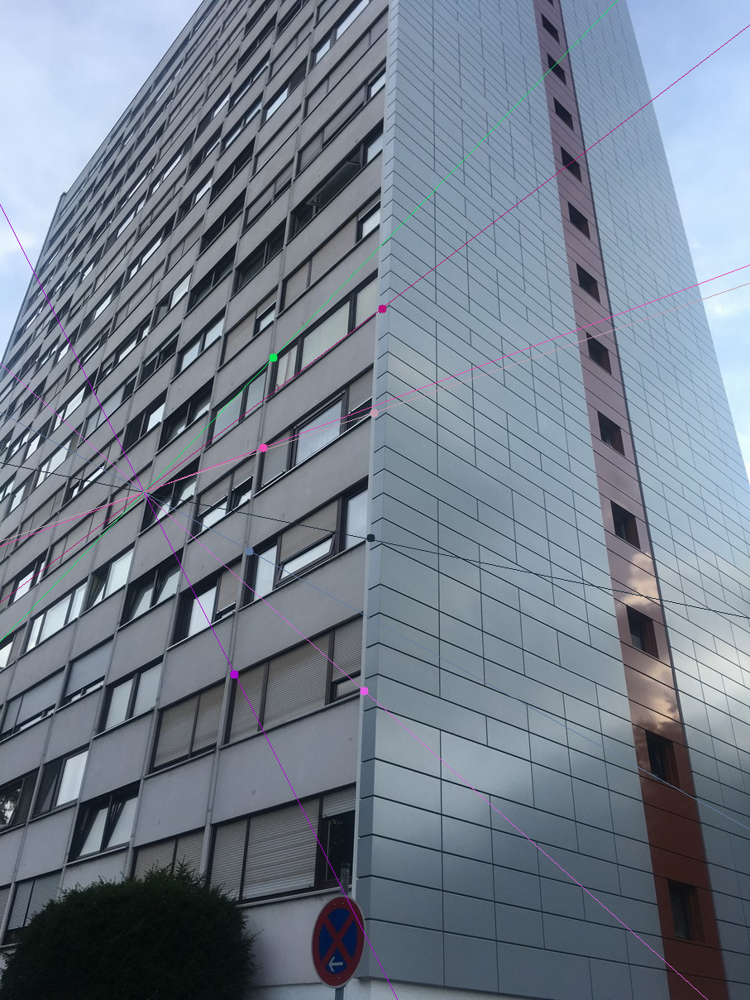

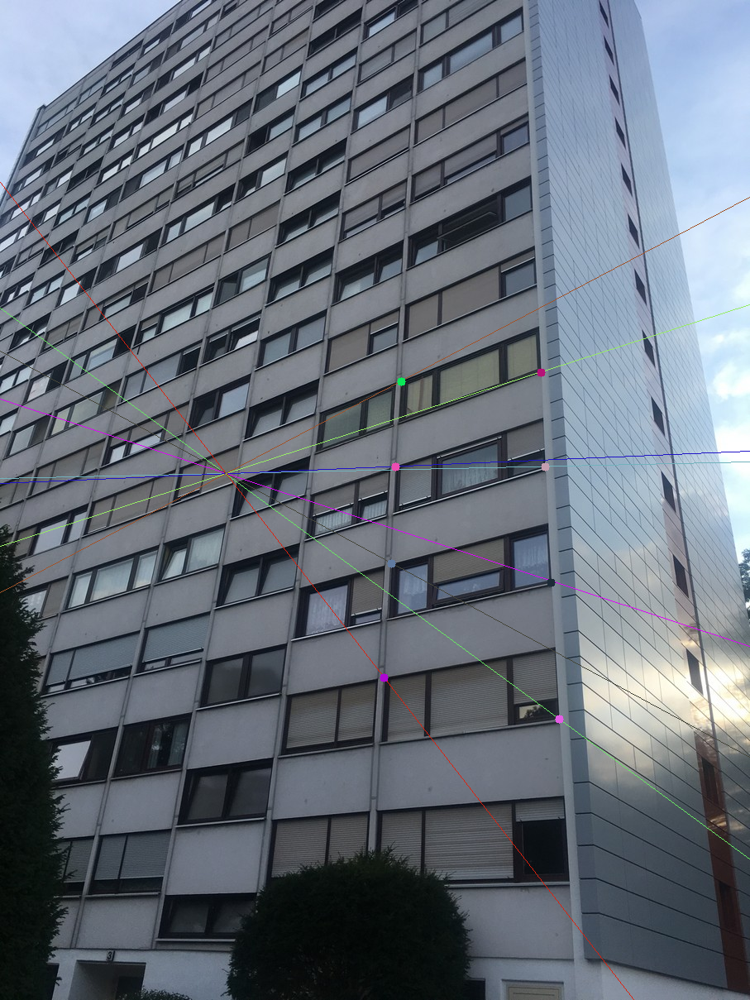

Fundamental matrix: 
 [[-3.52823043e-06  1.48549319e-05 -6.70100146e-03]
 [-6.12121673e-06  2.34197479e-06 -7.43512232e-04]
 [ 3.69880048e-03 -2.60091265e-03  1.00000000e+00]]


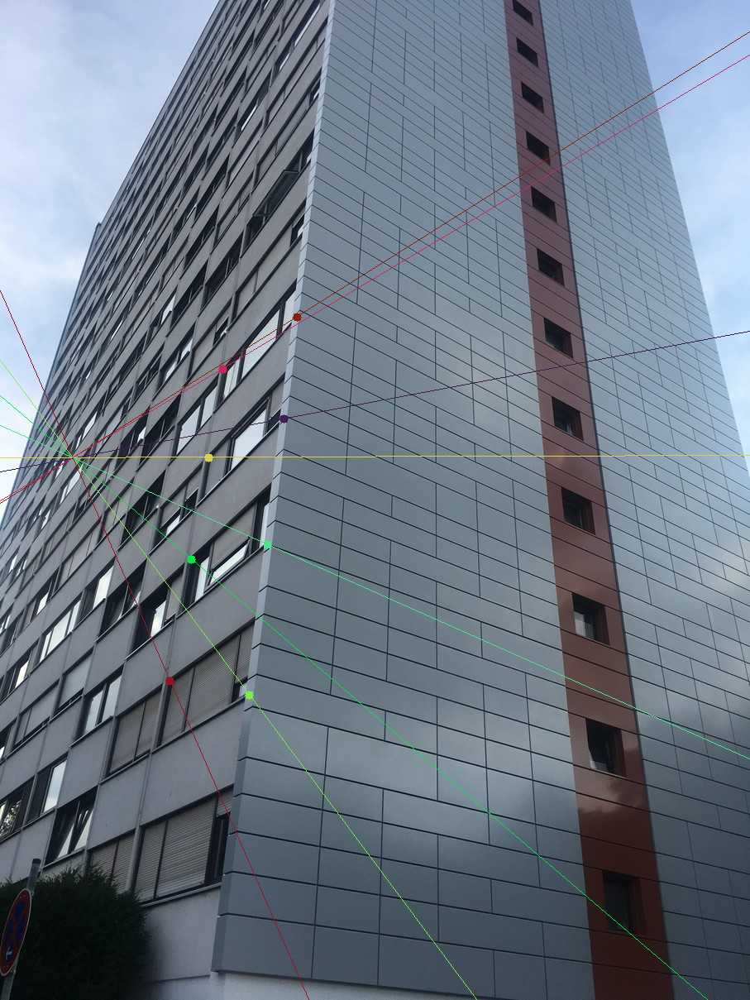

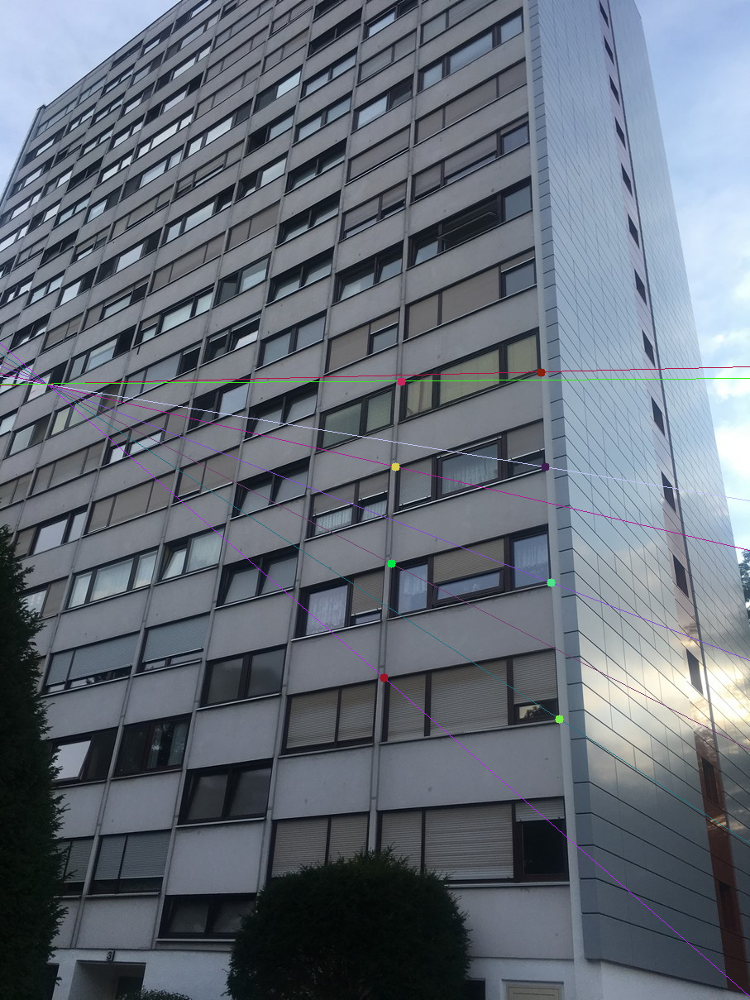

Fundamental matrix: 
 [[-2.08852814e-04  5.28658348e-04 -2.50544671e-01]
 [-3.76354562e-04  4.97771996e-05  8.75749278e-02]
 [ 2.96905591e-01 -1.56659179e-01  1.00000000e+00]]


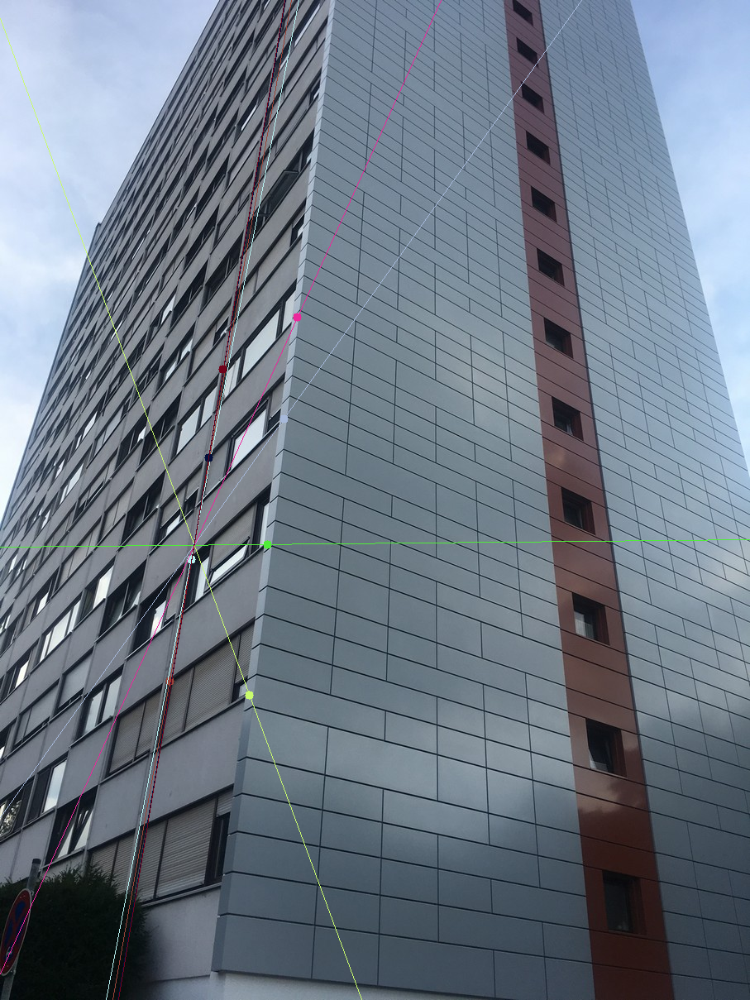

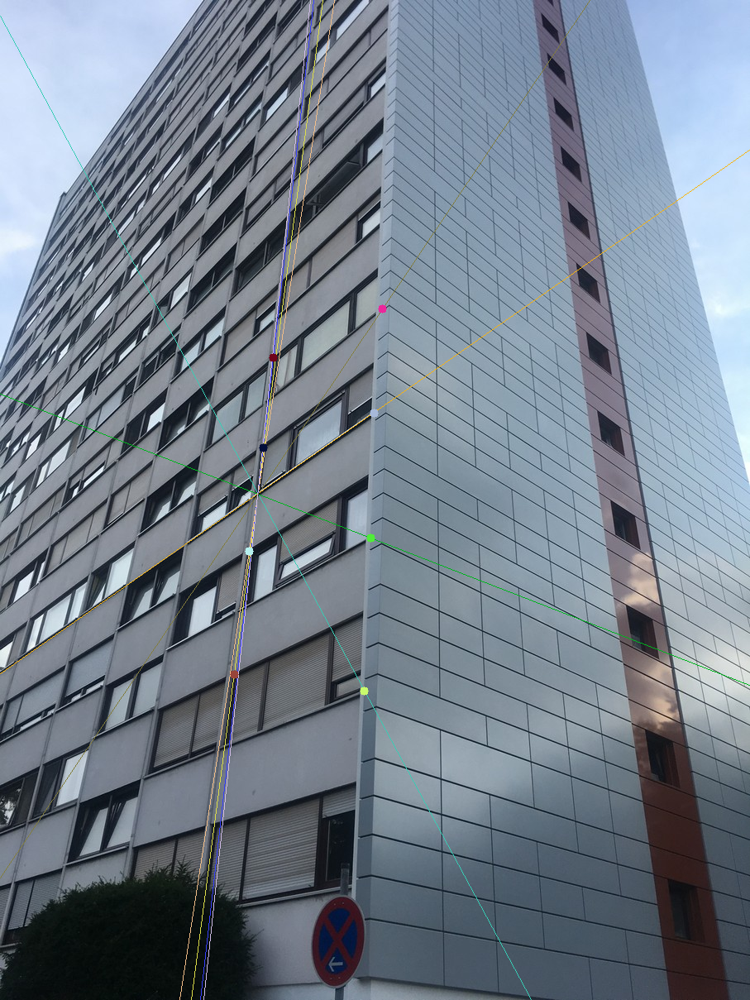

In [21]:
building_1 = cv2.imread("building_1.jpg")
building_2 = cv2.imread("building_2.jpg")
building_3 = cv2.imread("building_3.jpg")

findEpipolarLinesEnd2End(building_1, p_building_1, building_2, p_building_2)
findEpipolarLinesEnd2End(building_1, p_building_1, building_3, p_building_3)
findEpipolarLinesEnd2End(building_2, p_building_2, building_3, p_building_3)